<a href="https://colab.research.google.com/github/eridanletalis/gb_cv/blob/main/CV8_hw.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Реализовать синтезирование лиц из LFW с помощью DCGAN

В ходе экспериментов немного поменял сетку, увеличив число признаков для свёртки. Сделал около 81000 шагов, после 20к генератор выдаёт что-то похожее на фотографию человеческого лица

In [1]:
%tensorflow_version 2.x

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.manifold import TSNE

import tensorflow as tf
import tensorflow_datasets as tfds

In [3]:
train_ds, ds_info = tfds.load(
    'lfw', 
    as_supervised=True,
    with_info=True,
    split='train'
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/lfw/0.1.0.incompleteZ9DW69/lfw-train.tfrecord


  0%|          | 0/13233 [00:00<?, ? examples/s]

Dataset lfw downloaded and prepared to /root/tensorflow_datasets/lfw/0.1.0. Subsequent calls will reuse this data.


In [4]:

train_ds

<PrefetchDataset shapes: ((), (250, 250, 3)), types: (tf.string, tf.uint8)>

In [5]:
elem = train_ds.take(1)

for label, image in elem:
    print(image.shape, label)

(250, 250, 3) tf.Tensor(b'Tom_Amstutz', shape=(), dtype=string)


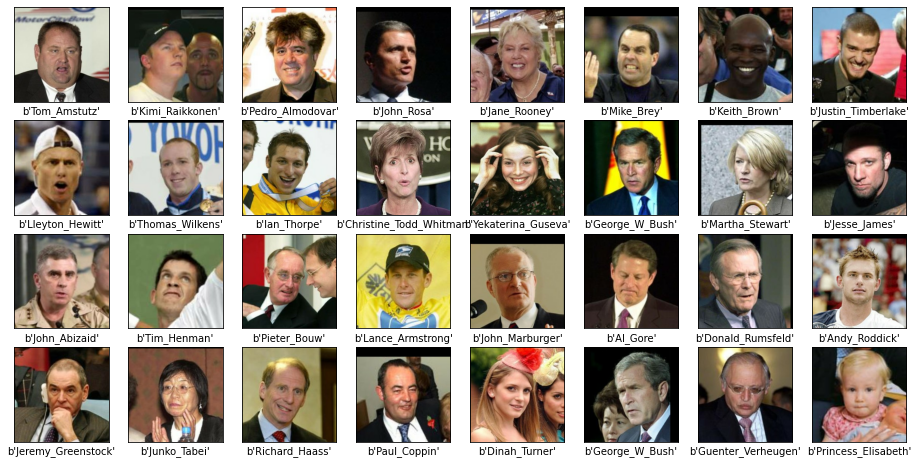

In [6]:
ds = train_ds.take(32)

fig = plt.figure(figsize=(16, 8))
j = 0
for label, image in tfds.as_numpy(ds):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(image)
    plt.xticks([]), plt.yticks([])
    plt.xlabel(str(label))
    j += 1
plt.show()

In [7]:
INP_SIZE = 128
NUM_EPOCHS = 60
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2

def prepare(label, img):
    img = (tf.cast(img, tf.float32) - 127.5) / 127.5 # / 255.
    return tf.image.resize(img, (INP_SIZE, INP_SIZE))

train_ds = train_ds.shuffle(buffer_size=len(train_ds))
# train_ds = train_ds.take(12800)
train_ds = train_ds.map(prepare)
train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)

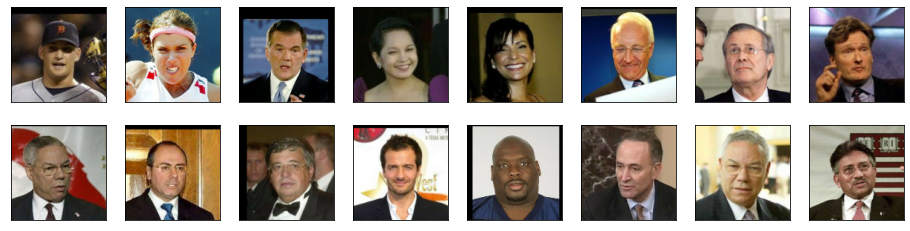

In [8]:
fig = plt.figure(figsize=(16, 4))
j = 0
for batch in tfds.as_numpy(train_ds.take(1)):
    for image in batch:
        ax = fig.add_subplot(2, 8, j+1)
        ax.imshow((image+1)/2.)
        plt.xticks([]), plt.yticks([])
        j += 1
plt.show()

In [9]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(256*32*32, activation='relu'),
    tf.keras.layers.Reshape((32, 32, 256)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(512, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.82),
    tf.keras.layers.ReLU(),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.82),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    # tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.29),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.27),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.25),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

In [10]:

INPUT_DIM = 128
LEARNING_RATE = 0.0001

optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [11]:

def plot_faces(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        ax.imshow((samples[j, ...].reshape(INP_SIZE, INP_SIZE, 3)+1)/2.)
        plt.xticks([]), plt.yticks([])
    plt.show()

In [12]:
len(train_ds)

49623

[Step   0] D Loss: 0.635719; G Loss: 0.684510


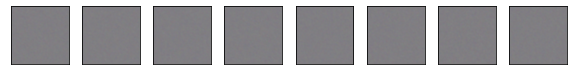

[Step 400] D Loss: 0.000611; G Loss: 0.001690


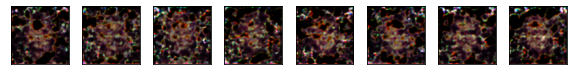

[Step 800] D Loss: 0.000560; G Loss: 0.001644


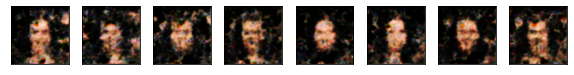

[Step 1200] D Loss: 0.000001; G Loss: 2.216615


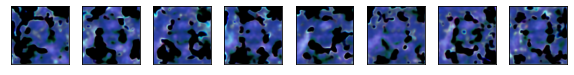

[Step 1600] D Loss: 0.848016; G Loss: 1.499023


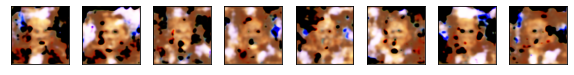

[Step 2000] D Loss: 0.338760; G Loss: 1.844411


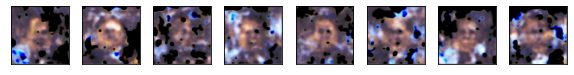

[Step 2400] D Loss: 0.526510; G Loss: 2.175655


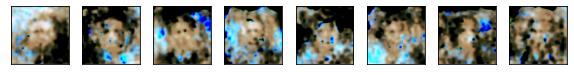

[Step 2800] D Loss: 0.972240; G Loss: 0.846729


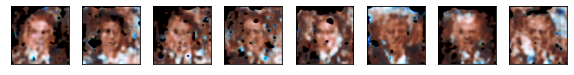

[Step 3200] D Loss: 0.654198; G Loss: 1.784276


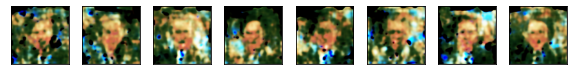

[Step 3600] D Loss: 0.357465; G Loss: 3.423484


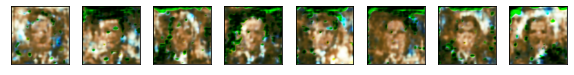

[Step 4000] D Loss: 0.551670; G Loss: 1.779685


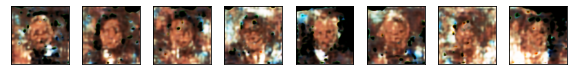

[Step 4400] D Loss: 0.551344; G Loss: 7.993674


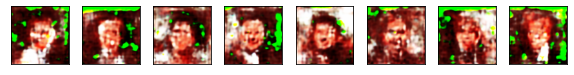

[Step 4800] D Loss: 0.582012; G Loss: 1.165713


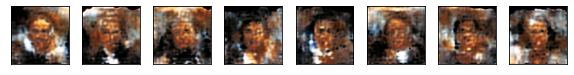

[Step 5200] D Loss: 0.009722; G Loss: 3.510096


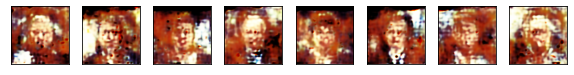

[Step 5600] D Loss: 0.265740; G Loss: 2.739990


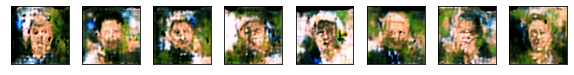

[Step 6000] D Loss: 0.886074; G Loss: 0.444925


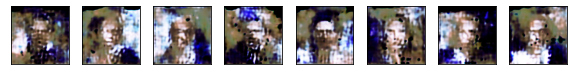

[Step 6400] D Loss: 0.002383; G Loss: 9.896127


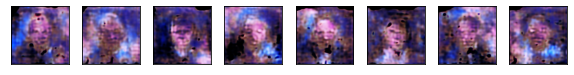

[Step 6800] D Loss: 0.504753; G Loss: 0.919601


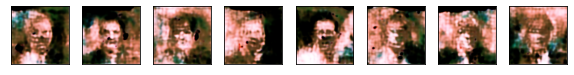

[Step 7200] D Loss: 0.133327; G Loss: 2.146749


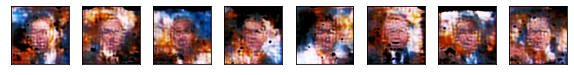

[Step 7600] D Loss: 1.283800; G Loss: 4.303269


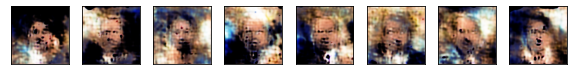

[Step 8000] D Loss: 1.221459; G Loss: 2.487960


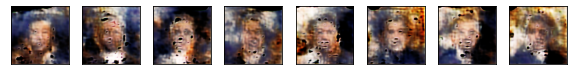

[Step 8400] D Loss: 1.016800; G Loss: 1.459039


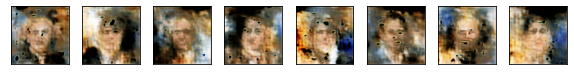

[Step 8800] D Loss: 0.266300; G Loss: 1.363062


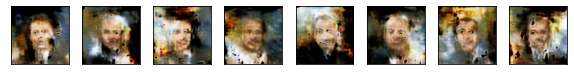

[Step 9200] D Loss: 1.628495; G Loss: 3.675155


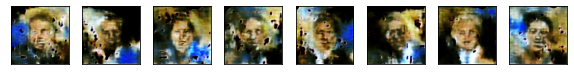

[Step 9600] D Loss: 0.256572; G Loss: 2.755889


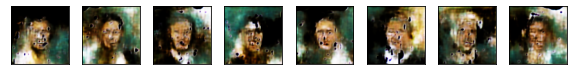

[Step 10000] D Loss: 0.218475; G Loss: 2.816136


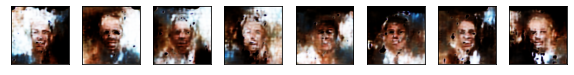

[Step 10400] D Loss: 0.554558; G Loss: 4.147387


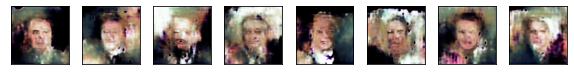

[Step 10800] D Loss: 0.421204; G Loss: 5.455460


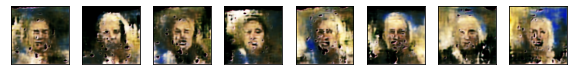

[Step 11200] D Loss: 0.591170; G Loss: 6.686287


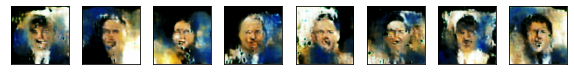

[Step 11600] D Loss: 0.499138; G Loss: 3.412282


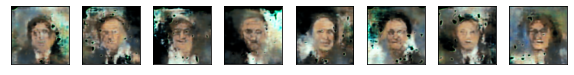

[Step 12000] D Loss: 0.032881; G Loss: 6.291047


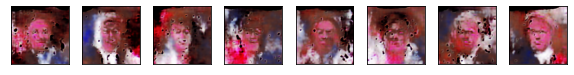

[Step 12400] D Loss: 0.416291; G Loss: 5.188946


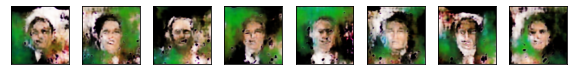

[Step 12800] D Loss: 0.533120; G Loss: 6.257622


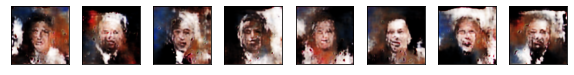

[Step 13200] D Loss: 0.453295; G Loss: 1.996662


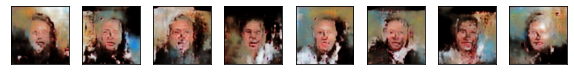

[Step 13600] D Loss: 1.696720; G Loss: 2.692283


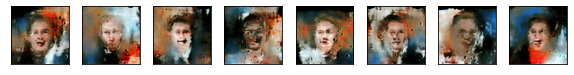

[Step 14000] D Loss: 0.263817; G Loss: 2.435280


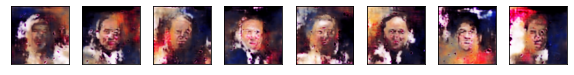

[Step 14400] D Loss: 0.415959; G Loss: 3.615757


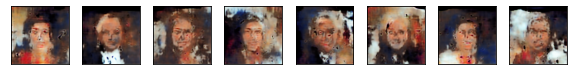

[Step 14800] D Loss: 0.147163; G Loss: 4.592490


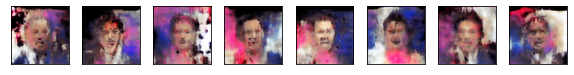

[Step 15200] D Loss: 0.393174; G Loss: 2.639046


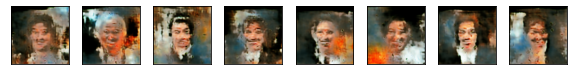

[Step 15600] D Loss: 0.328355; G Loss: 5.001348


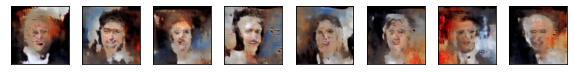

[Step 16000] D Loss: 0.140396; G Loss: 4.692529


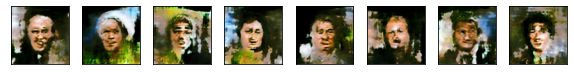

[Step 16400] D Loss: 0.183161; G Loss: 6.418722


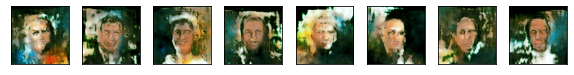

[Step 16800] D Loss: 0.452604; G Loss: 2.537130


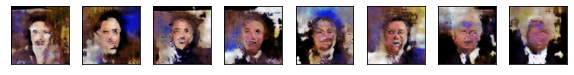

[Step 17200] D Loss: 0.312861; G Loss: 4.183331


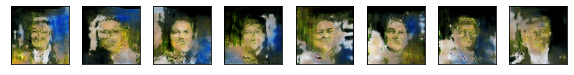

[Step 17600] D Loss: 0.251966; G Loss: 3.148337


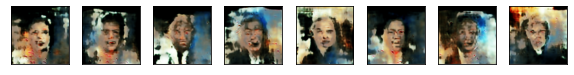

[Step 18000] D Loss: 0.255896; G Loss: 3.106647


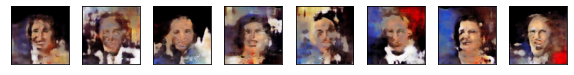

[Step 18400] D Loss: 0.235029; G Loss: 4.106619


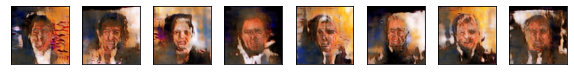

[Step 18800] D Loss: 0.450721; G Loss: 3.897034


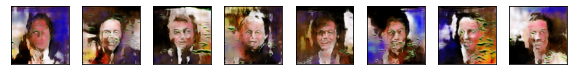

[Step 19200] D Loss: 0.228262; G Loss: 2.509411


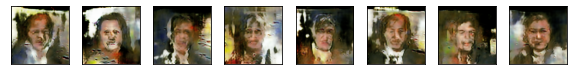

[Step 19600] D Loss: 0.978108; G Loss: 3.323939


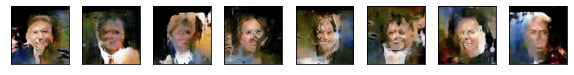

[Step 20000] D Loss: 0.208290; G Loss: 3.612136


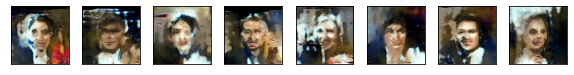

[Step 20400] D Loss: 0.728803; G Loss: 4.507901


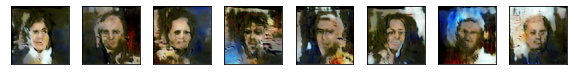

[Step 20800] D Loss: 0.252187; G Loss: 3.528646


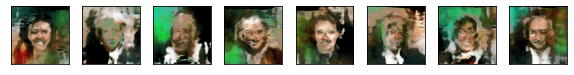

[Step 21200] D Loss: 0.333325; G Loss: 3.600036


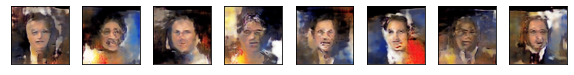

[Step 21600] D Loss: 0.362207; G Loss: 2.239389


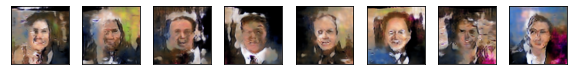

[Step 22000] D Loss: 0.282499; G Loss: 2.159738


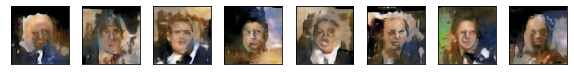

[Step 22400] D Loss: 0.255388; G Loss: 5.282579


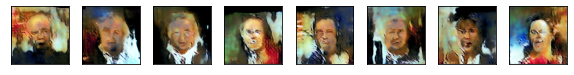

[Step 22800] D Loss: 0.485626; G Loss: 1.590066


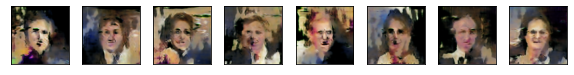

[Step 23200] D Loss: 0.116663; G Loss: 3.527095


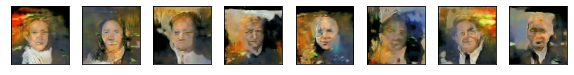

[Step 23600] D Loss: 0.542164; G Loss: 2.450744


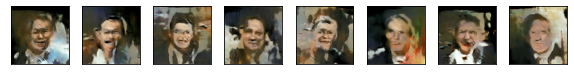

[Step 24000] D Loss: 0.484975; G Loss: 3.439209


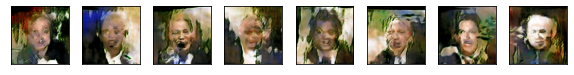

[Step 24400] D Loss: 0.382445; G Loss: 0.954267


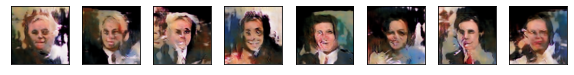

[Step 24800] D Loss: 0.498461; G Loss: 1.306776


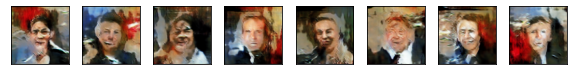

[Step 25200] D Loss: 0.584921; G Loss: 3.428450


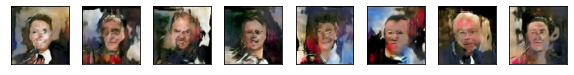

[Step 25600] D Loss: 0.459483; G Loss: 1.699087


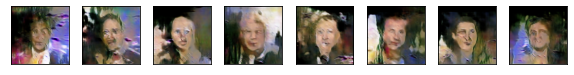

[Step 26000] D Loss: 0.254917; G Loss: 3.388561


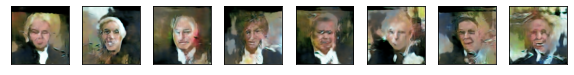

[Step 26400] D Loss: 0.396924; G Loss: 5.031668


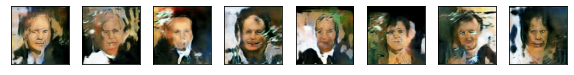

[Step 26800] D Loss: 0.577117; G Loss: 1.646345


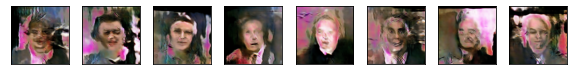

[Step 27200] D Loss: 0.724070; G Loss: 3.262423


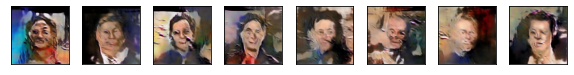

[Step 27600] D Loss: 0.492432; G Loss: 1.555688


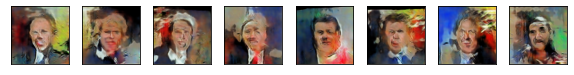

[Step 28000] D Loss: 0.381099; G Loss: 1.877768


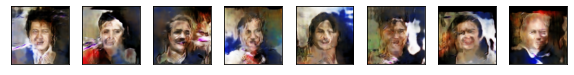

[Step 28400] D Loss: 0.316207; G Loss: 2.032083


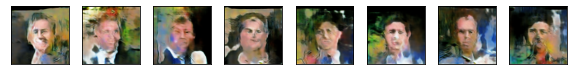

[Step 28800] D Loss: 0.370651; G Loss: 3.225680


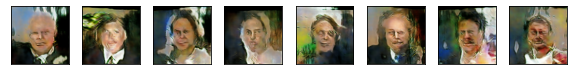

[Step 29200] D Loss: 0.197506; G Loss: 1.374331


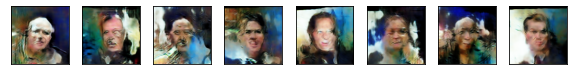

[Step 29600] D Loss: 0.355684; G Loss: 2.322741


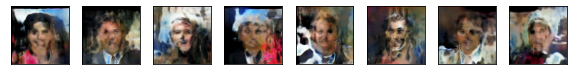

[Step 30000] D Loss: 0.430424; G Loss: 1.188932


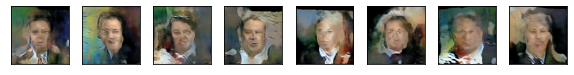

[Step 30400] D Loss: 0.561651; G Loss: 2.505886


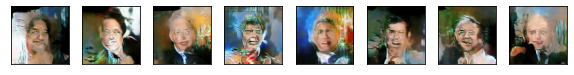

[Step 30800] D Loss: 0.618798; G Loss: 2.529373


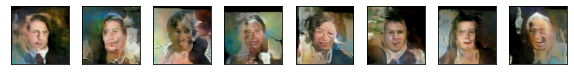

[Step 31200] D Loss: 0.449696; G Loss: 3.206814


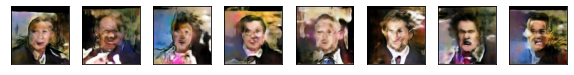

[Step 31600] D Loss: 0.629831; G Loss: 2.550368


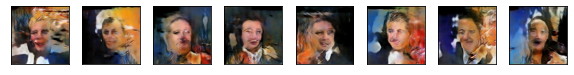

[Step 32000] D Loss: 0.654101; G Loss: 2.076515


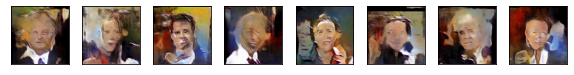

[Step 32400] D Loss: 0.415367; G Loss: 2.963597


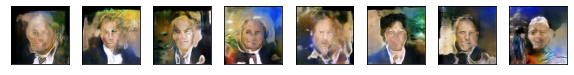

[Step 32800] D Loss: 0.420207; G Loss: 2.506210


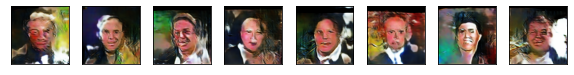

[Step 33200] D Loss: 0.541028; G Loss: 1.868785


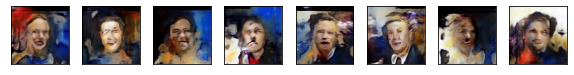

[Step 33600] D Loss: 0.431099; G Loss: 1.380637


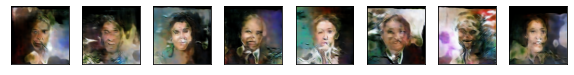

[Step 34000] D Loss: 0.716658; G Loss: 1.023875


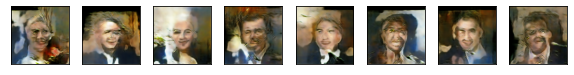

[Step 34400] D Loss: 0.635183; G Loss: 0.646371


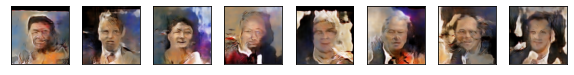

[Step 34800] D Loss: 0.424903; G Loss: 1.968358


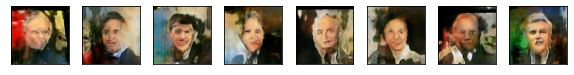

[Step 35200] D Loss: 0.651725; G Loss: 1.231627


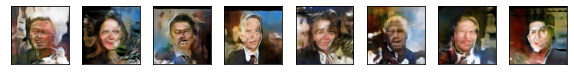

[Step 35600] D Loss: 0.570479; G Loss: 1.652503


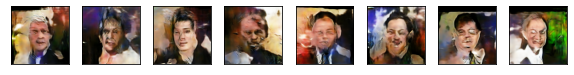

[Step 36000] D Loss: 0.426045; G Loss: 1.829171


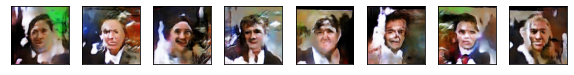

[Step 36400] D Loss: 0.665467; G Loss: 1.720732


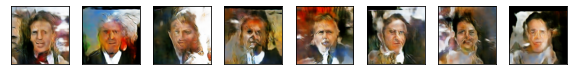

[Step 36800] D Loss: 0.498926; G Loss: 1.824161


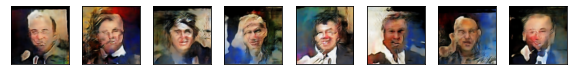

[Step 37200] D Loss: 0.385500; G Loss: 1.587183


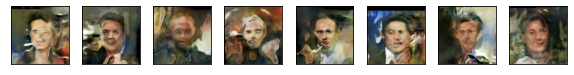

[Step 37600] D Loss: 0.575602; G Loss: 4.231319


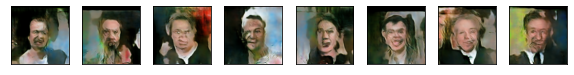

[Step 38000] D Loss: 0.385233; G Loss: 0.703729


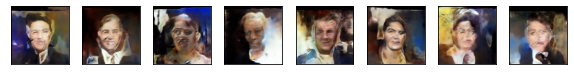

[Step 38400] D Loss: 0.688235; G Loss: 0.493330


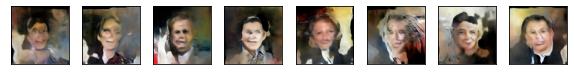

[Step 38800] D Loss: 0.455138; G Loss: 1.984038


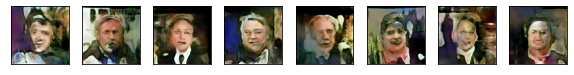

[Step 39200] D Loss: 0.516713; G Loss: 1.421944


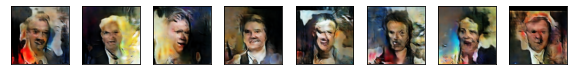

[Step 39600] D Loss: 0.473545; G Loss: 1.468533


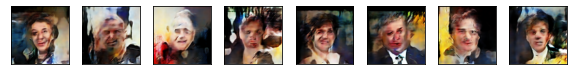

[Step 40000] D Loss: 0.437196; G Loss: 1.626041


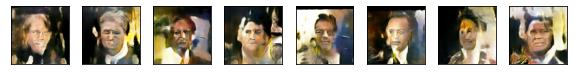

[Step 40400] D Loss: 0.588134; G Loss: 1.582873


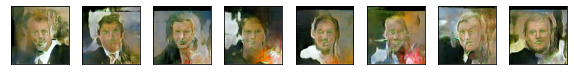

[Step 40800] D Loss: 0.527743; G Loss: 1.936955


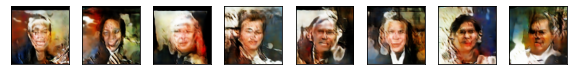

[Step 41200] D Loss: 0.866804; G Loss: 2.952039


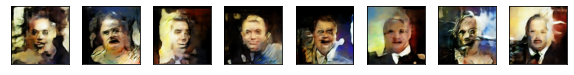

[Step 41600] D Loss: 0.493037; G Loss: 2.092759


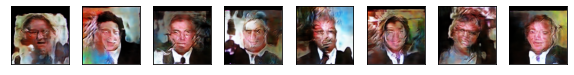

[Step 42000] D Loss: 0.561461; G Loss: 1.979333


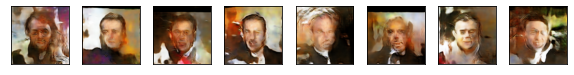

[Step 42400] D Loss: 0.682845; G Loss: 1.627148


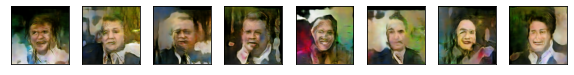

[Step 42800] D Loss: 0.680507; G Loss: 2.246893


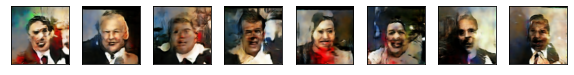

[Step 43200] D Loss: 0.436670; G Loss: 0.846402


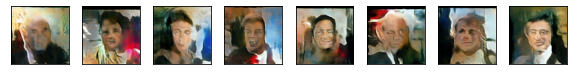

[Step 43600] D Loss: 0.504398; G Loss: 1.725307


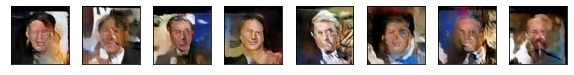

[Step 44000] D Loss: 0.535106; G Loss: 1.353045


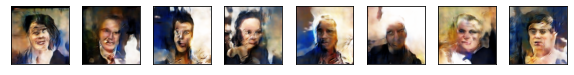

[Step 44400] D Loss: 0.509711; G Loss: 1.222742


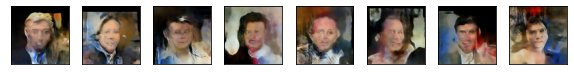

[Step 44800] D Loss: 0.429912; G Loss: 1.299848


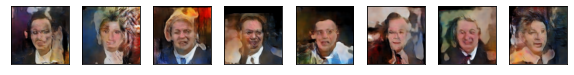

[Step 45200] D Loss: 0.682449; G Loss: 1.179544


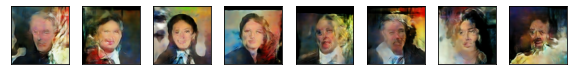

[Step 45600] D Loss: 0.796606; G Loss: 2.596725


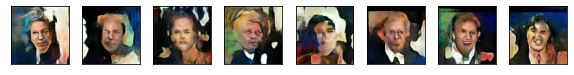

[Step 46000] D Loss: 0.663565; G Loss: 1.290256


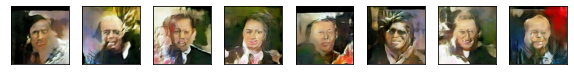

[Step 46400] D Loss: 0.631582; G Loss: 1.483289


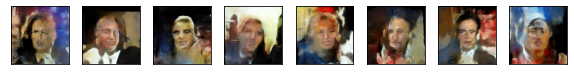

[Step 46800] D Loss: 0.723058; G Loss: 0.777368


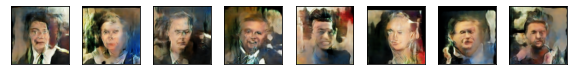

[Step 47200] D Loss: 0.361631; G Loss: 1.623328


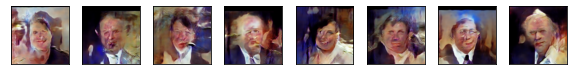

[Step 47600] D Loss: 0.329461; G Loss: 2.008938


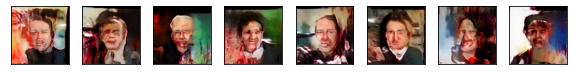

[Step 48000] D Loss: 1.364882; G Loss: 0.774007


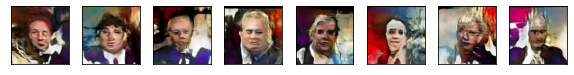

[Step 48400] D Loss: 0.470133; G Loss: 1.515235


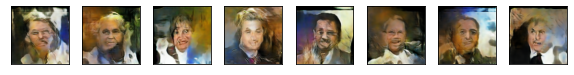

[Step 48800] D Loss: 0.581706; G Loss: 1.126940


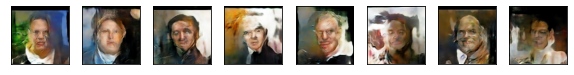

[Step 49200] D Loss: 0.844576; G Loss: 1.452501


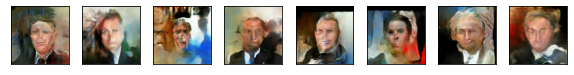

[Step 49600] D Loss: 0.473376; G Loss: 1.733892


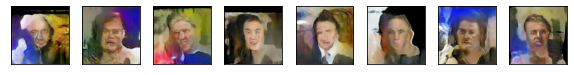

In [13]:
for step, true_images in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    # print(syntetic_images.shape, true_images.shape)
    # break
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 400 == 0:
        print('[Step %3d] D Loss: %.6f; G Loss: %.6f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_faces(syntetic_images)

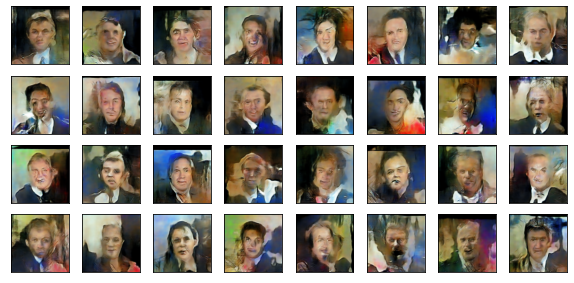

In [14]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

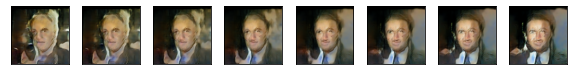

In [15]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

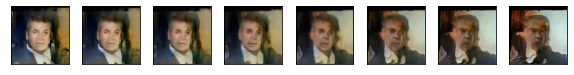

In [16]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

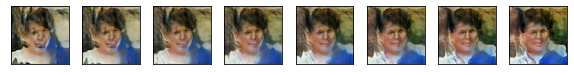

In [17]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

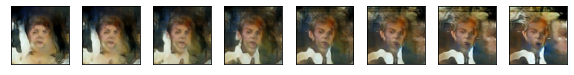

In [18]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

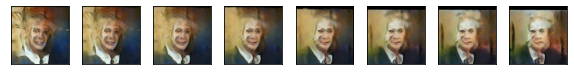

In [19]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)

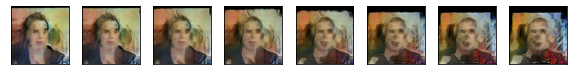

In [20]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_faces(syntetic_images)